In [1]:
## PRELIMINARIES ##
%load_ext autoreload
%autoreload 2

from IPython.display import HTML
from IPython.display import Javascript
HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
The raw code for this IPython notebook is by default hidden for easier reading.
To toggle on/off the raw code, click <a href="javascript:code_toggle()">here</a>.''')

In [2]:
def save_notebook():
    return display(Javascript("IPython.notebook.save_notebook()"),
                   include=['application/javascript'])

def output_HTML(read_file, output_file):
    from nbconvert import HTMLExporter
    import codecs
    import nbformat
    exporter = HTMLExporter()
    # read_file is '.ipynb', output_file is '.html'
    output_notebook = nbformat.read(read_file, as_version=4)
    output, resources = exporter.from_notebook_node(output_notebook)
    codecs.open(output_file, 'w', encoding='utf-8').write(output)

In [3]:
# Python imports
import sys
sys.path.append('../')
import glob

In [4]:
# Rankutils imports
from rankutils.cfgloader import *
from rankutils.utilities import safe_create_dir, completedir, getbasename
from rankutils.rIO import read_rank
from rankutils.statistical import diff_break_clustering
from rankutils.drawing import colors_from_cmap

In [5]:
# Other imports
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
%matplotlib inline
import mpld3

from sklearn.cluster import KMeans, MeanShift, DBSCAN, AffinityPropagation
from sklearn.preprocessing import MinMaxScaler

from jenkspy import jenks_breaks

In [6]:
# Matlab - We will start it later
import matlab.engine

In [7]:
# Few definitions
min_tail_size = 5
pathcfg = cfgloader('../path_2.cfg')
minmaxscaler = MinMaxScaler((0, 1))

# Rank Plotting Experiment

## Experimental Control Definitions <br>
Variable definitions that control the experiment to be plotted. Below is the descriptions of each one:
 - expkey: controls which experiment to get examples from, in the form `<dataset_key>_<descriptor_key>`
 - k: number of top positions
 - f: tail start factor
 - z: tail end factor
 - l: limitant on the number of ranked positions to get from rank
 - iidx: Defines which example to be run by its numbering
 - score_type: which score to be read from rank: _dists_ (distances), _normd_ (normalized distances), _votes_ (voting score), _normv_ (normalized votes). For _oxford100k_ and _unicamp100k_ use _votes_, for _places365_, _vggfaces_, and _imagenet_ use _dists_

In [8]:
expkey = 'imagenet_desc1'
k = 10
f = 0.0
z = 1.0
l = -1
iidx = 1094
score_type = 'dists'   # Controls type of score to be read from rank

# Loading and Plotting the Rank
We first load the rank we wish to work with, and plot it as a bar graph. Let's make four plots: raw scores, scores scaled between 0 and 1, raw scores converted from distance to similarity (_dist_ scores only), and scaled scores converted from distance to similarity (_dist_ scores only). To convert from distance to similarity, we subtract the rank values from the maximum rank value. For _dist_ ranks, a further post processing will be performed: if the first distance is 0, then only the remaining rank is used.

In [9]:
# Loading useful files according to definitions
rkflist = glob.glob(pathcfg['rank'][expkey] + "*.rk")
rkflist.sort()
rkfpath = rkflist[iidx]
rkname = getbasename(rkfpath)

In [10]:
# Loading and performing rank conversions
rank = read_rank(rkfpath, score_type)
if rank[0] == 0:
    rank = rank[1:]

rank_s = minmaxscaler.fit_transform(rank.reshape(-1, 1)).reshape(-1)

rank_c = []
if score_type == 'dists':
    rank_c = np.max(rank) - rank

rank_s_c = []
if score_type == 'dists':
    rank_s_c = np.max(rank_s) - rank_s

It's plotting time! We start by raw scores, highlighting the topk. Control the value of _lim_ to show less/more scores

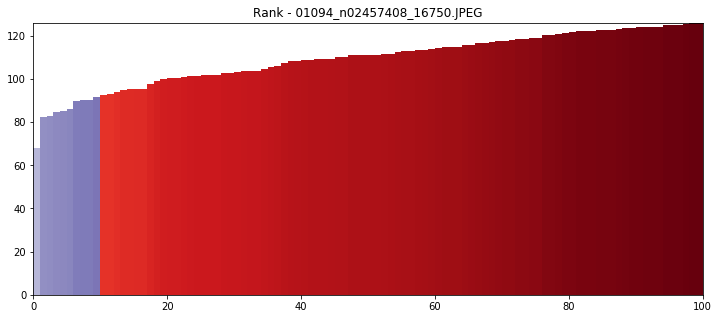

In [11]:
lim = 100

top = rank[0:k]
tail = rank[k:lim]

x_top = np.arange(0, k, 1, dtype=np.int32)
x_tail = np.arange(k, lim, 1, dtype=np.int32)

clist_top = colors_from_cmap('Purples', rank[0:lim], 0.4, 1.0)[0:k]
clist_tail = colors_from_cmap('Reds', rank[0:lim], 0.4, 1.0)[k:lim]

fig, ax = plt.subplots(1)
fig.set_size_inches(12, 5)
ax.set_title("Rank - {0:s}".format(rkname))

rect_top = ax.bar(x_top, top, 1.0, 0.0, align='edge', color=clist_top, label='Top {0:d}   '.format(k))
rect_tail = ax.bar(x_tail, tail, 1.0, 0.0, align='edge', color=clist_tail, label='Tail')

ax.set_xlim(left=0, right=x_tail[-1] + 1)
ax.set_ylim(bottom=0, top=tail[-1])

mpld3.enable_notebook()

Same rank but scaled between 0 and 1

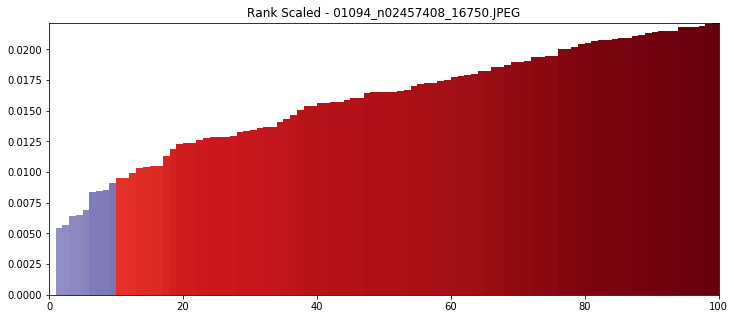

In [12]:
plt.close()

top = rank_s[0:k]
tail = rank_s[k:lim]

x_top = np.arange(0, k, 1, dtype=np.int32)
x_tail = np.arange(k, lim, 1, dtype=np.int32)

clist_top = colors_from_cmap('Purples', rank_s[0:lim], 0.4, 1.0)[0:k]
clist_tail = colors_from_cmap('Reds', rank_s[0:lim], 0.4, 1.0)[k:lim]

fig, ax = plt.subplots(1)
fig.set_size_inches(12, 5)
ax.set_title("Rank Scaled - {0:s}".format(rkname))

rect_top = ax.bar(x_top, top, 1.0, 0.0, align='edge', color=clist_top, label='Top {0:d}   '.format(k))
rect_tail = ax.bar(x_tail, tail, 1.0, 0.0, align='edge', color=clist_tail, label='Tail')

ax.set_xlim(left=0, right=x_tail[-1] + 1)
ax.set_ylim(bottom=0, top=tail[-1])

mpld3.enable_notebook()

Now Rank converted from distance to similarity, by subtracting the rank values from the max. Since all values will now be very high, we put the lower limit of the _y_ axis at the smallest value of the tail.

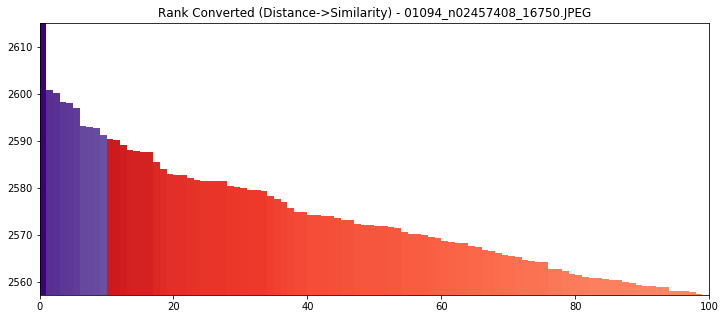

In [13]:
plt.close()

top = rank_c[0:k]
tail = rank_c[k:lim]

x_top = np.arange(0, k, 1, dtype=np.int32)
x_tail = np.arange(k, lim, 1, dtype=np.int32)

clist_top = colors_from_cmap('Purples', rank_c[0:lim], 0.4, 1.0)[0:k]
clist_tail = colors_from_cmap('Reds', rank_c[0:lim], 0.4, 1.0)[k:lim]

fig, ax = plt.subplots(1)
fig.set_size_inches(12, 5)
ax.set_title("Rank Converted (Distance->Similarity) - {0:s}".format(rkname))

rect_top = ax.bar(x_top, top, 1.0, 0.0, align='edge', color=clist_top, label='Top {0:d}   '.format(k))
rect_tail = ax.bar(x_tail, tail, 1.0, 0.0, align='edge', color=clist_tail, label='Tail')

ax.set_xlim(left=0, right=x_tail[-1] + 1)
ax.set_ylim(bottom=tail[-1], top=top[0])

mpld3.enable_notebook()

Now let's look at the scaled and converted chart

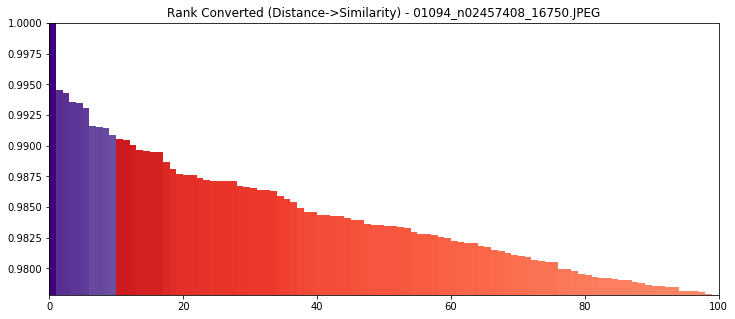

In [14]:
plt.close()

top = rank_s_c[0:k]
tail = rank_s_c[k:lim]

x_top = np.arange(0, k, 1, dtype=np.int32)
x_tail = np.arange(k, lim, 1, dtype=np.int32)

clist_top = colors_from_cmap('Purples', rank_s_c[0:lim], 0.4, 1.0)[0:k]
clist_tail = colors_from_cmap('Reds', rank_s_c[0:lim], 0.4, 1.0)[k:lim]

fig, ax = plt.subplots(1)
fig.set_size_inches(12, 5)
ax.set_title("Rank Converted (Distance->Similarity) - {0:s}".format(rkname))

rect_top = ax.bar(x_top, top, 1.0, 0.0, align='edge', color=clist_top, label='Top {0:d}   '.format(k))
rect_tail = ax.bar(x_tail, tail, 1.0, 0.0, align='edge', color=clist_tail, label='Tail')

ax.set_xlim(left=0, right=x_tail[-1] + 1)
ax.set_ylim(bottom=tail[-1], top=top[0])

mpld3.enable_notebook()

# Plotting the Densities
I show all four formats for the rank because I want to compare the behavior of the histogram in all four cases. This helps giving a broader sense of how the Weibull and GEV fits change according to the way we normalize scores, even though theoreticallly the behaviour of the scaled-converted distribution should not change, only be mirrored, in comparison to the original distribution. So let's go to the histograms. I'll plot first the histograms considering the full rank (top + tail), and in density form. The handy [numpy.histogram](https://docs.scipy.org/doc/numpy/reference/generated/numpy.histogram.html) function does that for us!

In [15]:
hist, edges = np.histogram(rank, bins='auto', density=True)
hist_s, edges_s = np.histogram(rank_s, bins='auto', density=True)
hist_c, edges_c = np.histogram(rank_c, bins='auto', density=True)
hist_s_c, edges_s_c = np.histogram(rank_s_c, bins='auto', density=True)

I'll plot all of them in a single subplots

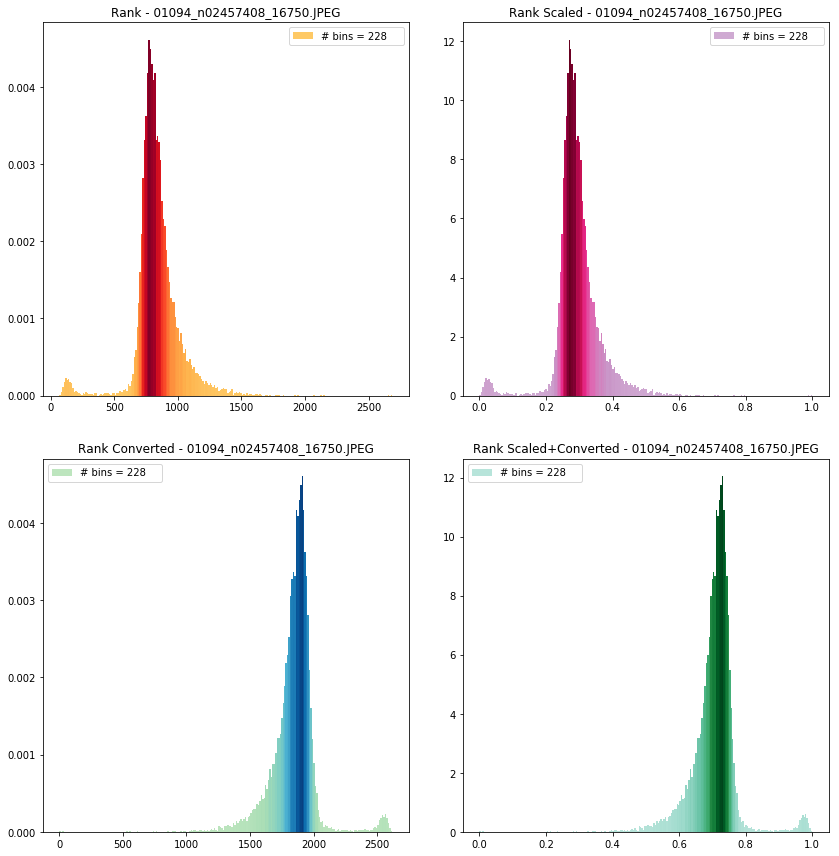

In [16]:
plt.close()

fig, axes = plt.subplots(2, 2)
ax0, ax1 = axes[0]
ax2, ax3 = axes[1]
fig.set_size_inches(12, 12)

# To compute the width of each bar, we use the distance between the limits of the two first bins
ax0.bar(edges[0:-1], hist, edges[1]-edges[0], 0.0, align='edge', 
        color=colors_from_cmap('YlOrRd', hist, 0.3, 1.0), label='# bins = {0:d}    '.format(hist.size))

ax1.bar(edges_s[0:-1], hist_s, edges_s[1]-edges_s[0], 0.0, align='edge', 
        color=colors_from_cmap('PuRd', hist_s, 0.3, 1.0), label='# bins = {0:d}    '.format(hist_s.size))

ax2.bar(edges_c[0:-1], hist_c, edges_c[1]-edges_c[0], 0.0, align='edge', 
        color=colors_from_cmap('GnBu', hist_c, 0.3, 1.0), label='# bins = {0:d}    '.format(hist_c.size))

ax3.bar(edges_s_c[0:-1], hist_s_c, edges_s_c[1]-edges_s_c[0], 0.0, align='edge', 
        color=colors_from_cmap('BuGn', hist_s_c, 0.3, 1.0), label='# bins = {0:d}    '.format(hist_s_c.size))

ax0.set_title('Rank - {0:s}'.format(rkname))
ax1.set_title('Rank Scaled - {0:s}'.format(rkname))
ax2.set_title('Rank Converted - {0:s}'.format(rkname))
ax3.set_title('Rank Scaled+Converted - {0:s}'.format(rkname))

# Some crazy ticks formatting stuff
"""
s = int(np.floor(edges.size*0.2))
ax0.set_xticks([edges[0]] + [edges[i] for i in range(s, edges.size-s, s)] + [edges[-1]])

s = int(np.floor(edges_s.size*0.2))
ax1.set_xticks([edges_s[0]] + [edges_s[i] for i in range(s, edges_s.size-s, s)] + [edges_s[-1]])

s = int(np.floor(edges_c.size*0.2))
ax2.set_xticks([edges_c[0]] + [edges_c[i] for i in range(s, edges_c.size-s, s)] + [edges_c[-1]])

s = int(np.floor(edges_s_c.size*0.2))
ax3.set_xticks([edges_s_c[0]] + [edges_s_c[i] for i in range(s, edges_s_c.size-s, s)] + [edges_s_c[-1]])
"""

ax0.legend()
ax1.legend()
ax2.legend()
ax3.legend()

plt.tight_layout(h_pad=3.0, w_pad=3.0)

mpld3.enable_notebook()

So far, so good! We see exactly the same behavior between the four curves, as expected, the only difference being that the distance->similarity converted curves are mirrored. Now, I'm gonna plot the same thing but considering **only the tail of each rank**. First, the histograms

In [17]:
thist, tedges = np.histogram(rank[k:], bins='auto', density=True)
thist_s, tedges_s = np.histogram(rank_s[k:], bins='auto', density=True)
thist_c, tedges_c = np.histogram(rank_c[k:], bins='auto', density=True)
thist_s_c, tedges_s_c = np.histogram(rank_s_c[k:], bins='auto', density=True)

Now, the densities

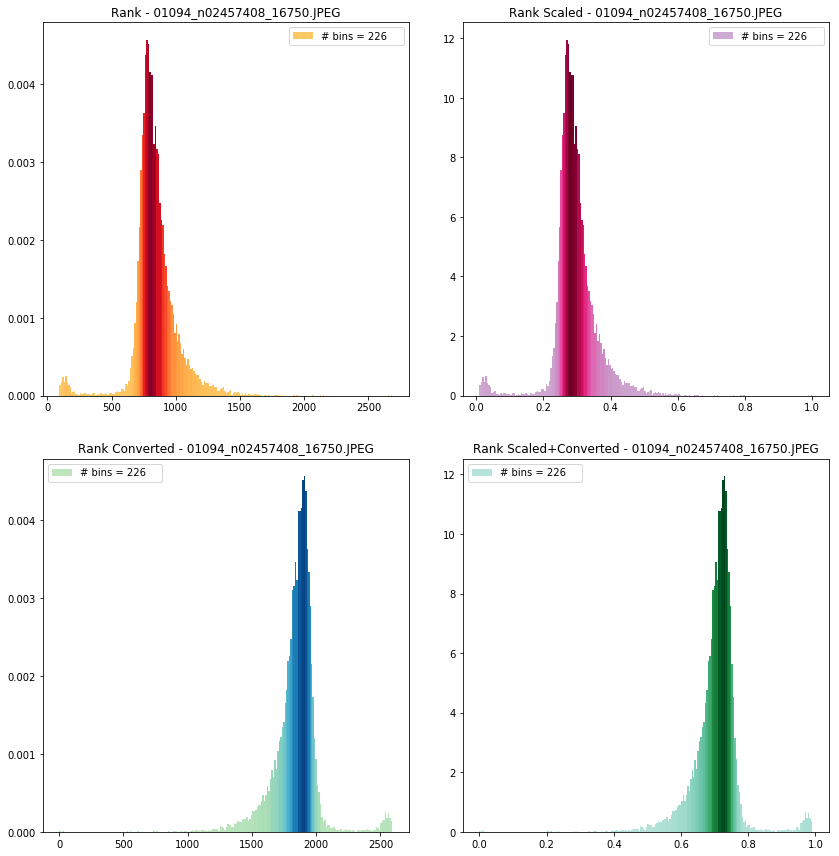

In [18]:
plt.close()

fig, axes = plt.subplots(2, 2)
ax0, ax1 = axes[0]
ax2, ax3 = axes[1]
fig.set_size_inches(12, 12)

# To compute the width of each bar, we use the distance between the limits of the two first bins
ax0.bar(tedges[0:-1], thist, tedges[1]-tedges[0], 0.0, align='edge', 
        color=colors_from_cmap('YlOrRd', hist, 0.3, 1.0), label='# bins = {0:d}    '.format(thist.size))

ax1.bar(tedges_s[0:-1], thist_s, tedges_s[1]-tedges_s[0], 0.0, align='edge', 
        color=colors_from_cmap('PuRd', hist_s, 0.3, 1.0), label='# bins = {0:d}    '.format(thist_s.size))

ax2.bar(tedges_c[0:-1], thist_c, tedges_c[1]-tedges_c[0], 0.0, align='edge', 
        color=colors_from_cmap('GnBu', hist_c, 0.3, 1.0), label='# bins = {0:d}    '.format(thist_c.size))

ax3.bar(tedges_s_c[0:-1], thist_s_c, tedges_s_c[1]-tedges_s_c[0], 0.0, align='edge', 
        color=colors_from_cmap('BuGn', hist_s_c, 0.3, 1.0), label='# bins = {0:d}    '.format(thist_s_c.size))

ax0.set_title('Rank - {0:s}'.format(rkname))
ax1.set_title('Rank Scaled - {0:s}'.format(rkname))
ax2.set_title('Rank Converted - {0:s}'.format(rkname))
ax3.set_title('Rank Scaled+Converted - {0:s}'.format(rkname))

# Some crazy ticks formatting stuff
"""
s = int(np.floor(tedges.size*0.2))
ax0.set_xticks([tedges[0]] + [tedges[i] for i in range(s, tedges.size-s, s)] + [tedges[-1]])

s = int(np.floor(tedges_s.size*0.2))
ax1.set_xticks([tedges_s[0]] + [tedges_s[i] for i in range(s, tedges_s.size-s, s)] + [tedges_s[-1]])

s = int(np.floor(tedges_c.size*0.2))
ax2.set_xticks([tedges_c[0]] + [tedges_c[i] for i in range(s, tedges_c.size-s, s)] + [tedges_c[-1]])

s = int(np.floor(tedges_s_c.size*0.2))
ax3.set_xticks([tedges_s_c[0]] + [tedges_s_c[i] for i in range(s, tedges_s_c.size-s, s)] + [tedges_s_c[-1]])
"""

ax0.legend()
ax1.legend()
ax2.legend()
ax3.legend()

plt.tight_layout(h_pad=3.0, w_pad=3.0)

mpld3.enable_notebook()

The overall format is very similar, sometimes the number of bins may change a bit, and the edges/size of each bin as well. But there is not much impact in the distribution itself.

# Plotting Weibull and GEV distributions
Let's take a break from bar graphs and plot the Weibull and GEV distributions fitted to the tail of each rank. Both will be fitted using matlabs _wblfit_ and _gevfit_ respectively. Weibull fits 2 parameters, shape and scale, while GEV fits shape, scale, and location. When preparing the data, I remove the zeroes as they are not accepted for Weibull fitting.

In [19]:
# Starting Matlab
matlab_engine = matlab.engine.start_matlab()

In [20]:
# Preping the data
tail = rank[k:]
tail_s = rank_s[k:]
tail_c = rank_c[k:]
tail_s_c = rank_s_c[k:]

data = matlab.double(tail[tail != 0].reshape(-1).tolist())
data_s = matlab.double(tail_s[tail_s != 0].reshape(-1).tolist())
data_c = matlab.double(tail_c[tail_c != 0].reshape(-1).tolist())
data_s_c = matlab.double(tail_s_c[tail_s_c != 0].reshape(-1).tolist())

# Weibull Fitting
estpar, _ = matlab_engine.wblfit(data, nargout=2)
wbl = dict(scale=estpar[0][0], shape=estpar[0][1], loc=0)

estpar, _ = matlab_engine.wblfit(data_s, nargout=2)
wbl_s = dict(scale=estpar[0][0], shape=estpar[0][1], loc=0)

estpar, _ = matlab_engine.wblfit(data_c, nargout=2)
wbl_c = dict(scale=estpar[0][0], shape=estpar[0][1], loc=0)

estpar, _ = matlab_engine.wblfit(data_s_c, nargout=2)
wbl_s_c = dict(scale=estpar[0][0], shape=estpar[0][1], loc=0)

# GEV fitting - Return order of shape and scale is inverted for gevfit
estpar, _ = matlab_engine.gevfit(data, nargout=2)
gev = dict(scale=estpar[0][1], shape=estpar[0][0], loc=estpar[0][2])

estpar, _ = matlab_engine.gevfit(data_s, nargout=2)
gev_s = dict(scale=estpar[0][1], shape=estpar[0][0], loc=estpar[0][2])

estpar, _ = matlab_engine.gevfit(data_c, nargout=2)
gev_c = dict(scale=estpar[0][1], shape=estpar[0][0], loc=estpar[0][2])

estpar, _ = matlab_engine.gevfit(data_s_c, nargout=2)
gev_s_c = dict(scale=estpar[0][1], shape=estpar[0][0], loc=estpar[0][2])

Now, let's generate the pdfs. Let _b_ be the number of bins of each histogram, I'll generate the pdf for values between 0 and 1000

In [21]:
x = matlab.double(np.linspace(0, np.floor(tedges[-1]*1.5), 10000).reshape(-1).tolist())
wbl['pdf'] = np.array(matlab_engine.wblpdf(x, wbl['scale'], wbl['shape']), dtype=np.float64).reshape(-1)

x = matlab.double(np.linspace(0, np.floor(tedges_s[-1]*1.5), 10000).reshape(-1).tolist())
wbl_s['pdf'] = np.array(matlab_engine.wblpdf(x, wbl_s['scale'], wbl_s['shape']), dtype=np.float64).reshape(-1)

x = matlab.double(np.linspace(0, np.floor(tedges_c[-1]*1.5), 10000).reshape(-1).tolist())
wbl_c['pdf'] = np.array(matlab_engine.wblpdf(x, wbl_c['scale'], wbl_c['shape']), dtype=np.float64).reshape(-1)

x = matlab.double(np.linspace(0, np.floor(tedges_s_c[-1]*1.5), 10000).reshape(-1).tolist())
wbl_s_c['pdf'] = np.array(matlab_engine.wblpdf(x, wbl_s_c['scale'], wbl_s_c['shape']), dtype=np.float64).reshape(-1)

Now, the GEV

In [22]:
x = matlab.double(np.linspace(0, np.floor(tedges[-1]*1.5), 10000).reshape(-1).tolist())
gev['pdf'] = np.array(matlab_engine.gevpdf(x, gev['shape'], gev['scale'], gev['loc']), dtype=np.float64).reshape(-1)

x = matlab.double(np.linspace(0, np.floor(tedges_s[-1]*1.5), 10000).reshape(-1).tolist())
gev_s['pdf'] = np.array(matlab_engine.gevpdf(x, gev_s['shape'], gev_s['scale'], gev_s['loc']), dtype=np.float64).reshape(-1)

x = matlab.double(np.linspace(0, np.floor(tedges_c[-1]*1.5), 10000).reshape(-1).tolist())
gev_c['pdf'] = np.array(matlab_engine.gevpdf(x, gev_c['shape'], gev_c['scale'], gev_c['loc']), dtype=np.float64).reshape(-1)

x = matlab.double(np.linspace(0, np.floor(tedges_s_c[-1]*1.5), 10000).reshape(-1).tolist())
gev_s_c['pdf'] = np.array(matlab_engine.gevpdf(x, gev_s_c['shape'], gev_s_c['scale'], gev_s_c['loc']), dtype=np.float64).reshape(-1)

Finally, the good part: plotting

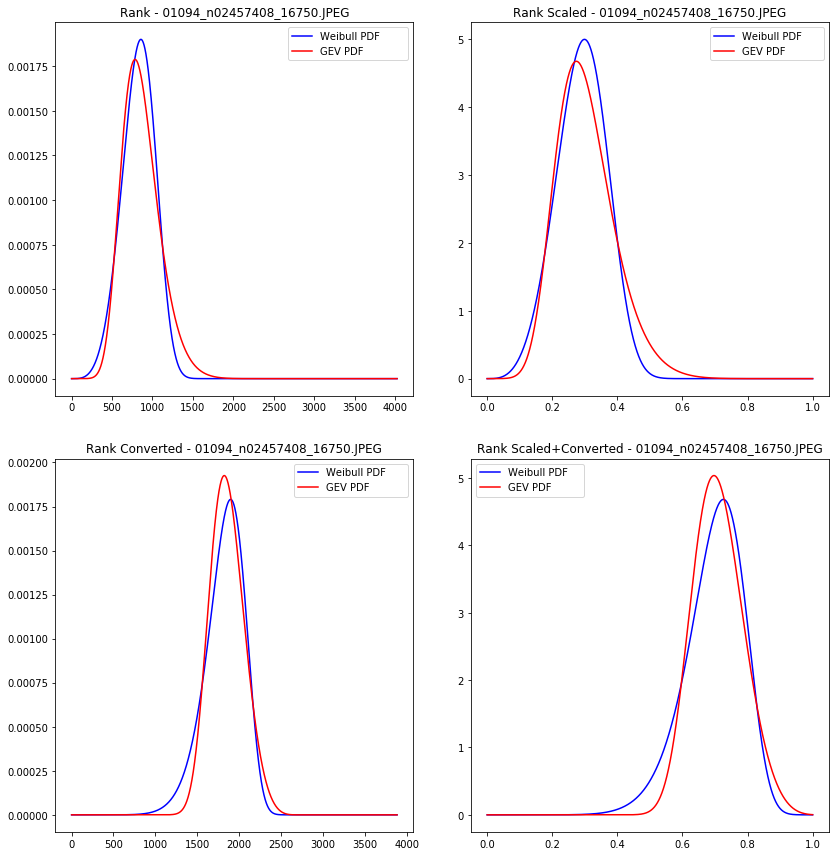

In [23]:
plt.close()

fig, axes = plt.subplots(2, 2)
ax0, ax1 = axes[0]
ax2, ax3 = axes[1]
fig.set_size_inches(12, 12)

x = np.linspace(0, np.floor(tedges[-1]*1.5), 10000)
ax0.plot(x, wbl['pdf'], color='blue', label='Weibull PDF', linewidth=1.5)
ax0.plot(x, gev['pdf'], color='red', label='GEV PDF             ', linewidth=1.5)

x = np.linspace(0, np.floor(tedges_s[-1]*1.5), 10000)
ax1.plot(x, wbl_s['pdf'], color='blue', label='Weibull PDF', linewidth=1.5)
ax1.plot(x, gev_s['pdf'], color='red', label='GEV PDF           ', linewidth=1.5)

x = np.linspace(0, np.floor(tedges_c[-1]*1.5), 10000)
ax2.plot(x, wbl_c['pdf'], color='blue', label='Weibull PDF', linewidth=1.5)
ax2.plot(x, gev_c['pdf'], color='red', label='GEV PDF           ', linewidth=1.5)

x = np.linspace(0, np.floor(tedges_s_c[-1]*1.5), 10000)
ax3.plot(x, wbl_s_c['pdf'], color='blue', label='Weibull PDF', linewidth=1.5)
ax3.plot(x, gev_s_c['pdf'], color='red', label='GEV PDF         ', linewidth=1.5)

ax0.set_title('Rank - {0:s}'.format(rkname))
ax1.set_title('Rank Scaled - {0:s}'.format(rkname))
ax2.set_title('Rank Converted - {0:s}'.format(rkname))
ax3.set_title('Rank Scaled+Converted - {0:s}'.format(rkname))

ax0.legend()
ax1.legend()
ax2.legend()
ax3.legend()

plt.tight_layout(h_pad=3.0, w_pad=3.0)

mpld3.enable_notebook()

Although the Rank Converted chart curve may look a little off (misaligned, to be precise) it is mostly due to the interval shown.

# Density and PDF Comparison
Finally, what we were waiting for: a comparison between the density histogram and the weibull/gev plots.

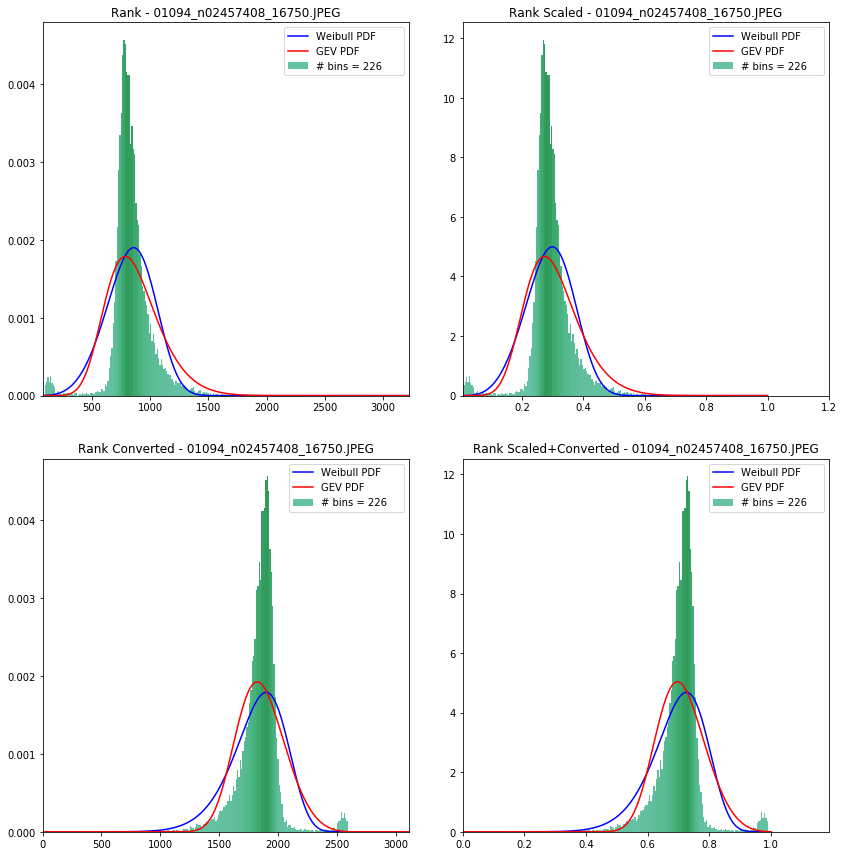

In [24]:
plt.close()

fig, axes = plt.subplots(2, 2)
ax0, ax1 = axes[0]
ax2, ax3 = axes[1]
fig.set_size_inches(12, 12)

x = np.linspace(0, np.floor(tedges[-1]*1.5), 10000)
ax0.plot(x, wbl['pdf'], color='blue', label='Weibull PDF', linewidth=1.5)
ax0.plot(x, gev['pdf'], color='red', label='GEV PDF             ', linewidth=1.5)
ax0.bar(tedges[0:-1], thist, tedges[1]-tedges[0], 0.0, align='edge', 
        color=colors_from_cmap('BuGn', hist, 0.5, 0.7), label='# bins = {0:d}    '.format(thist.size))

x = np.linspace(0, np.floor(tedges_s[-1]*1.5), 10000)
ax1.plot(x, wbl_s['pdf'], color='blue', label='Weibull PDF', linewidth=1.5)
ax1.plot(x, gev_s['pdf'], color='red', label='GEV PDF           ', linewidth=1.5)
ax1.bar(tedges_s[0:-1], thist_s, tedges_s[1]-tedges_s[0], 0.0, align='edge', 
        color=colors_from_cmap('BuGn', hist_s, 0.5, 0.7), label='# bins = {0:d}    '.format(thist_s.size))

x = np.linspace(0, np.floor(tedges_c[-1]*1.5), 10000)
ax2.plot(x, wbl_c['pdf'], color='blue', label='Weibull PDF', linewidth=1.5)
ax2.plot(x, gev_c['pdf'], color='red', label='GEV PDF           ', linewidth=1.5)
ax2.bar(tedges_c[0:-1], thist_c, tedges_c[1]-tedges_c[0], 0.0, align='edge', 
        color=colors_from_cmap('BuGn', hist_c, 0.5, 0.7), label='# bins = {0:d}    '.format(thist_c.size))

x = np.linspace(0, np.floor(tedges_s_c[-1]*1.5), 10000)
ax3.plot(x, wbl_s_c['pdf'], color='blue', label='Weibull PDF', linewidth=1.5)
ax3.plot(x, gev_s_c['pdf'], color='red', label='GEV PDF         ', linewidth=1.5)
ax3.bar(tedges_s_c[0:-1], thist_s_c, tedges_s_c[1]-tedges_s_c[0], 0.0, align='edge', 
        color=colors_from_cmap('BuGn', hist_s_c, 0.5, 0.7), label='# bins = {0:d}    '.format(thist_s_c.size))

ax0.set_title('Rank - {0:s}'.format(rkname))
ax1.set_title('Rank Scaled - {0:s}'.format(rkname))
ax2.set_title('Rank Converted - {0:s}'.format(rkname))
ax3.set_title('Rank Scaled+Converted - {0:s}'.format(rkname))

ax0.legend()
ax1.legend()
ax2.legend()
ax3.legend()

ax0.set_xlim(tedges[0]*0.8, tedges[-1]*1.2)
ax1.set_xlim(tedges_s[0]*0.8, tedges_s[-1]*1.2)
ax2.set_xlim(tedges_c[0]*0.8, tedges_c[-1]*1.2)
ax3.set_xlim(tedges_s_c[0]*0.8, tedges_s_c[-1]*1.2)

"""
s = int(np.floor(tedges.size*0.2))
ax0.set_xticks([tedges[0]] + [tedges[i] for i in range(s, tedges.size-s, s)] + [tedges[-1]])

s = int(np.floor(tedges_s.size*0.2))
ax1.set_xticks([tedges_s[0]] + [tedges_s[i] for i in range(s, tedges_s.size-s, s)] + [tedges_s[-1]])

s = int(np.floor(tedges_c.size*0.2))
ax2.set_xticks([tedges_c[0]] + [tedges_c[i] for i in range(s, tedges_c.size-s, s)] + [tedges_c[-1]])

s = int(np.floor(tedges_s_c.size*0.2))
ax3.set_xticks([tedges_s_c[0]] + [tedges_s_c[i] for i in range(s, tedges_s_c.size-s, s)] + [tedges_s_c[-1]])
"""

plt.tight_layout(h_pad=3.0, w_pad=3.0)

mpld3.enable_notebook()

# Conclusions
A few thoughts about this experiment:
- In general, it seems like either Weibull and GEV fit well to the curve of scores. This, considering the scores as a set of samples from a distribution. Comparing the fitted distributions with the density histogram allows us to visualize well this result
- Scaling doesn't seem to affect the result. Perhaps the effect will be felt better when finding the theshold T
- For some reason, GEV seems to fit better for distances, instead of similarities
- Although the fit is very good for some examples, other have quite poor fits (try `vggfaces_desc1:1094`)

In [25]:
save_notebook()
current_file = 'rank_plots.ipynb'
output_file = './output/rank_plots_{0:s}_{1:s}.html'.format(expkey, rkname) 
output_HTML(current_file, output_file)